<a href="https://colab.research.google.com/github/Thodupunuri/deep-learning-with-python-notebooks/blob/master/Copy_of_Human_Activity_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
pip install youtube-dl==2020.12.2


In [5]:
!pip install pafy youtube-dl moviepy
import os
import cv2
import math
import pafy
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from moviepy.editor import *
from collections import deque
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model


In [6]:
seed_constant = 23
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)


In [7]:
!wget -nc --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar
!unrar x UCF50.rar -inul -y


--2022-02-01 12:11:06--  https://www.crcv.ucf.edu/data/UCF50.rar
Resolving www.crcv.ucf.edu (www.crcv.ucf.edu)... 132.170.214.127
Connecting to www.crcv.ucf.edu (www.crcv.ucf.edu)|132.170.214.127|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 3233554570 (3.0G) [application/rar]
Saving to: ‘UCF50.rar’

UCF50.rar           100%[===================>]   3.01G  66.6MB/s    in 62s     

2022-02-01 12:12:08 (50.0 MB/s) - ‘UCF50.rar’ saved [3233554570/3233554570]



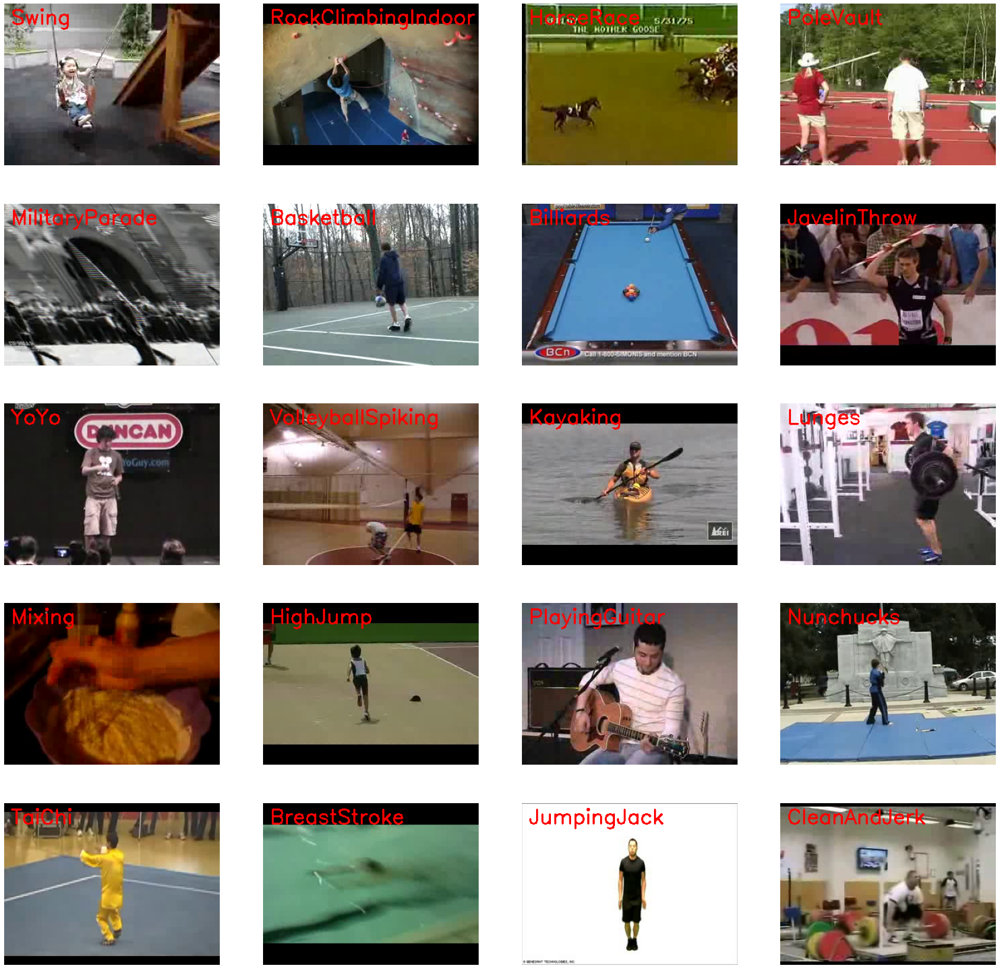

In [8]:
plt.figure(figsize = (30, 30))
all_classes_names = os.listdir('UCF50')
random_range = random.sample(range(len(all_classes_names)), 20)
for counter, random_index in enumerate(random_range, 1):
    selected_class_Name = all_classes_names[random_index]
    video_files_names_list = os.listdir(f'UCF50/{selected_class_Name}')
    selected_video_file_name = random.choice(video_files_names_list)
    video_reader = cv2.VideoCapture(f'UCF50/{selected_class_Name}/{selected_video_file_name}')
    _, bgr_frame = video_reader.read()
    video_reader.release()
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    plt.subplot(5, 4, counter)
    plt.imshow(rgb_frame)
    plt.axis('off')


In [9]:
image_height, image_width = 64, 64
max_images_per_class = 8000
dataset_directory = "UCF50"
classes_list = ["WalkingWithDog", "TaiChi", "Swing", "HorseRace"]
model_output_size = len(classes_list)


In [10]:
def frames_extraction(video_path):
    frames_list = []
    video_reader = cv2.VideoCapture(video_path)
    while True:
        success, frame = video_reader.read()
        if not success:
            break
        resized_frame = cv2.resize(frame, (image_height, image_width))
        normalized_frame = resized_frame / 255
        frames_list.append(normalized_frame)
    video_reader.release()
    return frames_list

In [11]:
def create_dataset():
    temp_features = []
    features = []
    labels = []
    for class_index, class_name in enumerate(classes_list):
        print(f'Extracting Data of Class: {class_name}')
        files_list = os.listdir(os.path.join(dataset_directory, class_name))
        for file_name in files_list:
            video_file_path = os.path.join(dataset_directory, class_name, file_name)
            frames = frames_extraction(video_file_path)
            temp_features.extend(frames)
        features.extend(random.sample(temp_features, max_images_per_class))
        labels.extend([class_index] * max_images_per_class)
        temp_features.clear()
    features = np.asarray(features)
    labels = np.array(labels) 
    return features, labels

In [12]:
features, labels = create_dataset()


Extracting Data of Class: WalkingWithDog
Extracting Data of Class: TaiChi
Extracting Data of Class: Swing
Extracting Data of Class: HorseRace


In [13]:
one_hot_encoded_labels = to_categorical(labels)


In [14]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.2, shuffle = True, random_state = seed_constant)

In [15]:
def create_model():
    model = Sequential()
    model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu', input_shape = (image_height, image_width, 3)))
    model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size = (2, 2)))
    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dense(model_output_size, activation = 'softmax'))
    model.summary()
    return model
model = create_model()
print("Model Created Successfully!")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 62, 62, 64)        1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 60, 60, 64)        36928     
                                                                 
 batch_normalization (BatchN  (None, 60, 60, 64)       256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 30, 30, 64)       0         
 )                                                               
                                                                 
 global_average_pooling2d (G  (None, 64)               0         
 lobalAveragePooling2D)                                          
                                                        

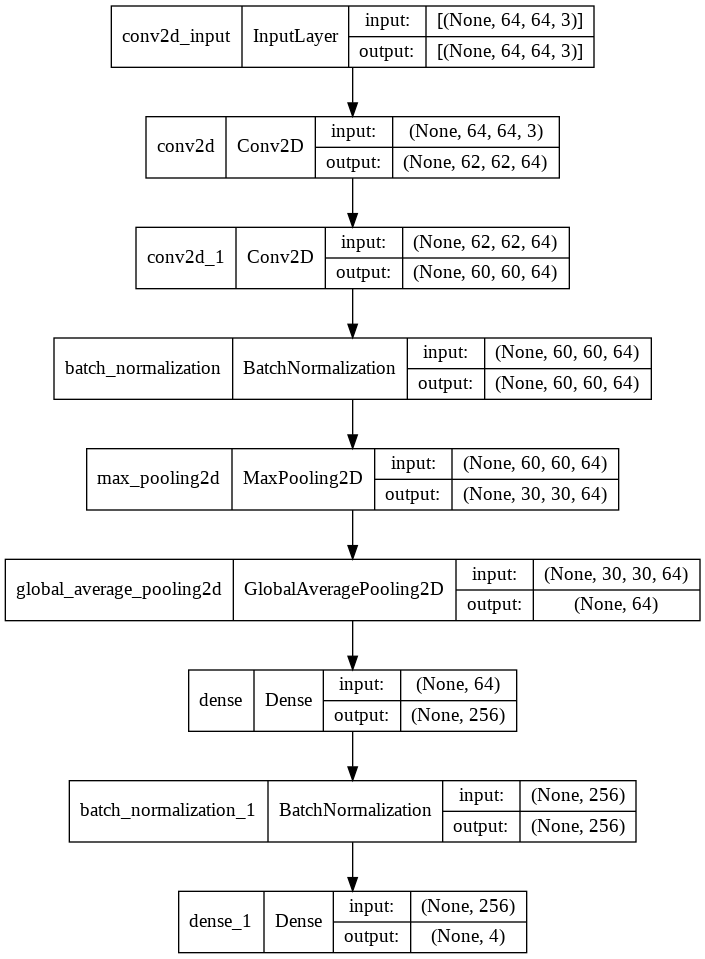

In [16]:
plot_model(model, to_file = 'model_structure_plot.png', show_shapes = True, show_layer_names = True)

In [17]:
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)
model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])
model_training_history = model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 4 , shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/50
5120/5120 [==============================] - 89s 15ms/step - loss: 0.8777 - accuracy: 0.6454 - val_loss: 0.5254 - val_accuracy: 0.8025
Epoch 2/50
5120/5120 [==============================] - 76s 15ms/step - loss: 0.5307 - accuracy: 0.8043 - val_loss: 1.1851 - val_accuracy: 0.7559
Epoch 3/50
5120/5120 [==============================] - 76s 15ms/step - loss: 0.3991 - accuracy: 0.8593 - val_loss: 0.4686 - val_accuracy: 0.8904
Epoch 4/50
5120/5120 [==============================] - 77s 15ms/step - loss: 0.3342 - accuracy: 0.8826 - val_loss: 0.4636 - val_accuracy: 0.8551
Epoch 5/50
5120/5120 [==============================] - 77s 15ms/step - loss: 0.2980 - accuracy: 0.8978 - val_loss: 0.1229 - val_accuracy: 0.9684
Epoch 6/50
5120/5120 [==============================] - 76s 15ms/step - loss: 0.2549 - accuracy: 0.9126 - val_loss: 0.2541 - val_accuracy: 0.9445
Epoch 7/50
5120/5120 [==============================] - 77s 15ms/step - loss: 0.2495 - accuracy: 0.9167 - val_loss: 0.1395 -

In [18]:
model_evaluation_history = model.evaluate(features_test, labels_test)

200/200 [==============================] - 3s 12ms/step - loss: 0.1481 - accuracy: 0.9652


In [20]:
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history
model_name = f'Model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'
model.save(model_name)


In [21]:
def plot_metric(metric_name_1, metric_name_2, plot_name):
  metric_value_1 = model_training_history.history[metric_name_1]
  metric_value_2 = model_training_history.history[metric_name_2]
  epochs = range(len(metric_value_1))
  plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
  plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)
  plt.title(str(plot_name))
  plt.legend()

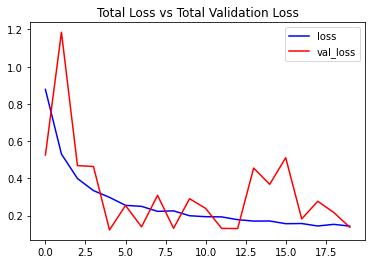

In [22]:
plot_metric('loss', 'val_loss', 'Total Loss vs Total Validation Loss')

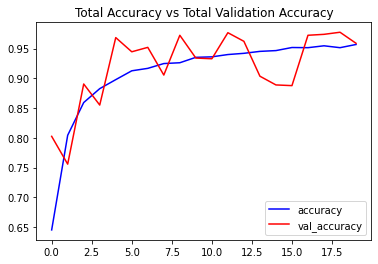

In [23]:
plot_metric('accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

In [24]:
def download_youtube_videos(youtube_video_url, output_directory):
    video = pafy.new(youtube_video_url)
    video_best = video.getbest()
    output_file_path = f'{output_directory}/{video.title}.mp4'
    video_best.download(filepath = output_file_path, quiet = True)
    return video.title

In [25]:
def predict_on_live_video(video_file_path, output_file_path, window_size):
    predicted_labels_probabilities_deque = deque(maxlen = window_size)
    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'), 24, (original_video_width, original_video_height))
    while True:
        status, frame = video_reader.read()
        if not status:
            break
        resized_frame = cv2.resize(frame, (image_height, image_width))
        normalized_frame = resized_frame / 255
        predicted_labels_probabilities = model.predict(np.expand_dims(normalized_frame, axis = 0))[0]
        predicted_labels_probabilities_deque.append(predicted_labels_probabilities)
        if len(predicted_labels_probabilities_deque) == window_size:
            predicted_labels_probabilities_np = np.array(predicted_labels_probabilities_deque)
            predicted_labels_probabilities_averaged = predicted_labels_probabilities_np.mean(axis = 0)
            predicted_label = np.argmax(predicted_labels_probabilities_averaged)
            predicted_class_name = classes_list[predicted_label]
            cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
        video_writer.write(frame)
    video_reader.release()
    video_writer.release()

In [28]:
output_directory = 'Youtube_Videos'
os.makedirs(output_directory, exist_ok = True)
video_title = download_youtube_videos('https://www.youtube.com/watch?v=8u0qjmHIOcE', output_directory)
input_video_file_path = f'{output_directory}/{video_title}.mp4'

In [29]:
window_size = 1
output_video_file_path = f'{output_directory}/{video_title} -Output-WSize {window_size}.mp4'
predict_on_live_video(input_video_file_path, output_video_file_path, window_size)
VideoFileClip(output_video_file_path).ipython_display(width = 700)

100%|██████████| 866/866 [00:01<00:00, 566.67it/s]


In [30]:
window_size = 25
output_video_file_path = f'{output_directory}/{video_title} -Output-WSize {window_size}.mp4'
predict_on_live_video(input_video_file_path, output_video_file_path, window_size)
VideoFileClip(output_video_file_path).ipython_display(width = 700)

100%|██████████| 866/866 [00:01<00:00, 563.48it/s]


In [31]:
def make_average_predictions(video_file_path, predictions_frames_count):
    predicted_labels_probabilities_np = np.zeros((predictions_frames_count, model_output_size), dtype = np.float)
    video_reader = cv2.VideoCapture(video_file_path)
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = video_frames_count // predictions_frames_count
    for frame_counter in range(predictions_frames_count):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        _ , frame = video_reader.read()
        resized_frame = cv2.resize(frame, (image_height, image_width))
        normalized_frame = resized_frame / 255
        predicted_labels_probabilities = model.predict(np.expand_dims(normalized_frame, axis = 0))[0]
        predicted_labels_probabilities_np[frame_counter] = predicted_labels_probabilities
    predicted_labels_probabilities_averaged = predicted_labels_probabilities_np.mean(axis = 0)
    predicted_labels_probabilities_averaged_sorted_indexes = np.argsort(predicted_labels_probabilities_averaged)[::-1]
    for predicted_label in predicted_labels_probabilities_averaged_sorted_indexes:
        predicted_class_name = classes_list[predicted_label]
        predicted_probability = predicted_labels_probabilities_averaged[predicted_label]
        print(f"CLASS NAME: {predicted_class_name}   AVERAGED PROBABILITY: {(predicted_probability*100):.2}")
    video_reader.release()

In [32]:
video_title = download_youtube_videos('https://www.youtube.com/watch?v=ceRjxW4MpOY', output_directory)
input_video_file_path = f'{output_directory}/{video_title}.mp4'
make_average_predictions(input_video_file_path, 50)
VideoFileClip(input_video_file_path).ipython_display(width = 700)


CLASS NAME: TaiChi   AVERAGED PROBABILITY: 9.5e+01
CLASS NAME: Swing   AVERAGED PROBABILITY: 5.4
CLASS NAME: WalkingWithDog   AVERAGED PROBABILITY: 0.044
CLASS NAME: HorseRace   AVERAGED PROBABILITY: 0.00021


100%|██████████| 1322/1322 [00:02<00:00, 484.99it/s]


In [33]:
video_title = download_youtube_videos('https://www.youtube.com/watch?v=ayI-e3cJM-0', output_directory)
input_video_file_path = f'{output_directory}/{video_title}.mp4'
make_average_predictions(input_video_file_path, 50)
VideoFileClip(input_video_file_path).ipython_display(width = 700)


CLASS NAME: Swing   AVERAGED PROBABILITY: 6.8e+01
CLASS NAME: WalkingWithDog   AVERAGED PROBABILITY: 2.2e+01
CLASS NAME: HorseRace   AVERAGED PROBABILITY: 9.8
CLASS NAME: TaiChi   AVERAGED PROBABILITY: 1.8e-05


100%|██████████| 1650/1650 [00:32<00:00, 50.83it/s]


In [35]:
video_title = download_youtube_videos('https://www.youtube.com/watch?v=WHBu6iePxKc', output_directory)
input_video_file_path = f'{output_directory}/{video_title}.mp4'
make_average_predictions(input_video_file_path, 50)
VideoFileClip(input_video_file_path).ipython_display(width = 700)


CLASS NAME: HorseRace   AVERAGED PROBABILITY: 9.5e+01
CLASS NAME: Swing   AVERAGED PROBABILITY: 5.3
CLASS NAME: WalkingWithDog   AVERAGED PROBABILITY: 0.044
CLASS NAME: TaiChi   AVERAGED PROBABILITY: 0.0075


100%|██████████| 1651/1651 [00:30<00:00, 54.49it/s]
